In [2]:
# Import the libraries
import torch
import torchvision.transforms as transforms
from torchvision import models
import clip
import numpy as np
from PIL import Image
import os
from tqdm import tqdm
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import average_precision_score, precision_recall_curve, precision_score
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets
from sklearn.metrics.pairwise import cosine_similarity
from collections import Counter

sns.set(style="whitegrid")

/opt/conda/lib/python3.10/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(


In [58]:
def preprocess_image_resnet(img_path):
    """
    Preprocesses an input image for ResNet-based models.

    This function resizes the image to 224x224 pixels, converts it to a tensor, 
    and normalizes it using the standard ImageNet mean and standard deviation.

    Parameters:
    - img_path (str): Path to the image file.

    Returns:
    - torch.Tensor: Preprocessed image tensor of shape (1, 3, 224, 224).
    """
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ])
    image = Image.open(img_path).convert("RGB")
    return preprocess(image).unsqueeze(0)

def extract_embedding(model, img_tensor):
    """
    Passes a preprocessed image tensor through the model to extract feature embeddings.

    Parameters:
    - model (torch.nn.Module): The feature extractor model.
    - img_tensor (torch.Tensor): Preprocessed image tensor.

    Returns:
    - np.ndarray: Extracted embedding vector (1D array).
    """
    with torch.no_grad():
        return model(img_tensor).squeeze().numpy()

def extract_clip_embedding(img_path):
    """
    Extracts image embeddings using the CLIP visual encoder.

    Parameters:
    - img_path (str): Path to the image file.

    Returns:
    - np.ndarray: Feature vector generated by CLIP (typically 512 dimensions).
    """
    image = preprocess_clip(Image.open(img_path)).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features = clip_model.encode_image(image)
    return image_features.squeeze().cpu().numpy()

def compute_cosine_similarity(query_vec, gallery_vecs):
    """
    Computes cosine similarity between a query vector and a gallery of vectors.

    Parameters:
    - query_vec (np.ndarray): Feature vector of the query image.
    - gallery_vecs (np.ndarray): 2D array of feature vectors to compare against.

    Returns:
    - np.ndarray: Array of cosine similarity scores.
    """
    return cosine_similarity([query_vec], gallery_vecs)[0]

def evaluate_map(similarities, true_labels, query_label):
    """
    Calculates the Average Precision (AP) for a given query.

    Parameters:
    - similarities (list or np.ndarray): Similarity scores between the query and gallery images.
    - true_labels (list): Labels corresponding to the gallery images.
    - query_label (str or int): The label of the query image.

    Returns:
    - float: Average Precision (AP) score for the current query.
    """
    relevances = [1 if lbl == query_label else 0 for lbl in true_labels]
    return average_precision_score(relevances, similarities)

def plot_precision_recall(similarities, true_labels, query_label):
    """
    Plots the Precision-Recall (PR) curve for a given query.

    Parameters:
    - similarities (list or np.ndarray): Similarity scores between the query and gallery images.
    - true_labels (list): Labels of the gallery images.
    - query_label (str or int): Label of the query image.

    Returns:
    - None. Displays a matplotlib plot.
    """
    relevances = [1 if lbl == query_label else 0 for lbl in true_labels]
    precision, recall, _ = precision_recall_curve(relevances, similarities)
    plt.plot(recall, precision)

# Custom dataset class to load images and their labels from a text file
# Inherits from torch.utils.data.Dataset to be used with PyTorch DataLoader
class CustomImageDataset(Dataset):
    def __init__(self, data_dir, label_file, transform=None):
        """
        Initializes the dataset by reading image paths and their labels.

        Parameters:
        - data_dir (str): Directory where image files are stored.
        - label_file (str): Path to a .txt file containing image names and labels (tab-separated).
        - transform (callable, optional): Optional image transformations to apply (e.g., resizing, normalization).
        """
        self.data_dir = data_dir
        self.label_file = label_file
        self.transform = transform

        self.image_paths = []
        self.labels = []
        with open(label_file, 'r') as file:
            for line in file.readlines():
                path, label = line.strip().split('\t')
                self.image_paths.append(os.path.join(data_dir, path))
                self.labels.append(label)

    def __len__(self):
        """
        Returns the total number of samples in the dataset.
        This enables len(dataset) to return the number of items.
        """
        return len(self.image_paths)

    def __getitem__(self, idx):
        """
        Retrieves the image and label at the specified index.

        Parameters:
        - idx (int): Index of the item to retrieve.

        Returns:
        - tuple: (image, label), where image is a tensor and label is a string.
        """
        img_path = self.image_paths[idx]
        image = datasets.folder.pil_loader(img_path)
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label

def extract_features(model, dataloader, model_type="resnet", device="cpu"):
    """
    Extracts feature vectors from a dataset using the specified visual encoder.

    This function iterates over a DataLoader, applies the given model to extract 
    feature representations for each image, and collects the corresponding labels.

    Parameters:
    - model (torch.nn.Module): The visual encoder model (e.g., ResNet, CLIP, DINOv2).
    - dataloader (torch.utils.data.DataLoader): DataLoader that yields (image, label) pairs.
    - model_type (str): Type of model. Accepted values: "resnet", "clip", or "dinov2".
                        Determines how the model processes the input.
    - device (str or torch.device): Device to use for computation (e.g., "cuda" or "cpu").

    Returns:
    - features (np.ndarray): 2D array of extracted feature vectors (shape: N x D).
    - labels (np.ndarray): 1D array of labels corresponding to each feature.
    """
    features = []
    labels = []
    with torch.no_grad():
        for inputs, targets in tqdm(dataloader):
            if model_type == "clip":
                inputs = inputs.to(device)
                outputs = model.encode_image(inputs)
            elif model_type == "dinov2":
                inputs = inputs.to(device)
                outputs = model(inputs)
            else:  # default: resnet
                inputs = inputs.to(device)
                outputs = model(inputs)
            
            features.append(outputs.cpu().numpy())
            labels.extend(targets)

    return np.concatenate(features, axis=0), np.array(labels)

def compute_similarity_matrix(embeddings):
    """
    Computes the cosine similarity matrix between all image embeddings.

    Parameters:
    - embeddings (np.ndarray): Array of shape (N, D), where N is the number of images 
      and D is the dimensionality of the feature vectors.

    Returns:
    - np.ndarray: Cosine similarity matrix of shape (N, N).
    """
    return cosine_similarity(embeddings)


def compute_map_per_query(sim_matrix, labels):
    """
    Computes the Average Precision (AP) for each image as a query using leave-one-out.

    For each image, we treat it as a query and calculate AP with respect to the rest 
    of the dataset (excluding itself). Relevance is determined based on class labels.

    Parameters:
    - sim_matrix (np.ndarray): Cosine similarity matrix of shape (N, N).
    - labels (list or np.ndarray): Ground-truth labels for each image (can be strings).

    Returns:
    - list of float: AP score for each query image.
    """
    N = len(labels)
    ap_scores = []

    for i in range(N):
        # Remove the query itself from similarity and label lists
        sims = np.delete(sim_matrix[i], i)
        rels = np.delete(np.array(labels) == labels[i], i).astype(int)

        # Compute Average Precision (AP) for this query
        ap = average_precision_score(rels, sims)
        ap_scores.append(ap)

    return ap_scores


def plot_pr_curve_for_query(sim_row, labels, query_idx, save_path=None):
    """
    Plots the Precision-Recall (PR) curve for a single query image.

    Parameters:
    - sim_row (np.ndarray): Similarity scores between the query and all other images.
    - labels (list): Ground-truth labels for the dataset.
    - query_idx (int): Index of the query image (used for exclusion and labeling).
    - save_path (str, optional): If provided, saves the plot to this path.

    Returns:
    - None (displays or saves the plot).
    """
    # Remove the query itself from similarity and label arrays
    sims = np.delete(sim_row, query_idx)
    rels = np.delete(np.array(labels) == labels[query_idx], query_idx).astype(int)

    # Compute precision and recall values
    precision, recall, _ = precision_recall_curve(rels, sims)

    # Plot the PR curve
    plt.figure(figsize=(5, 4))
    plt.plot(recall, precision, label=f'Query #{query_idx}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'PR Curve - Image #{query_idx}')
    plt.grid(True)

    # Save or display the figure
    if save_path:
        plt.savefig(save_path)
    else:
        plt.show()


def evaluate_embeddings(embeddings, labels, top_k_examples=5):
    """
    Performs full evaluation of image embeddings:
    - Computes cosine similarity
    - Calculates mAP across all queries
    - Prints and returns best/worst queries based on AP score

    Parameters:
    - embeddings (np.ndarray): Feature vectors of all images (N, D).
    - labels (list or np.ndarray): Ground-truth class labels for each image.
    - top_k_examples (int): Number of top and bottom queries to highlight.

    Returns:
    - dict: Contains:
        - 'sim_matrix': cosine similarity matrix
        - 'ap_scores': list of AP scores per query
        - 'mean_ap': average of all AP scores
        - 'best_idxs': indices of top-k queries with highest AP
        - 'worst_idxs': indices of top-k queries with lowest AP
    """
    # Step 1: Compute pairwise cosine similarity
    sim_matrix = compute_similarity_matrix(embeddings)

    # Step 2: Compute AP for each query using leave-one-out
    ap_scores = compute_map_per_query(sim_matrix, labels)

    # Step 3: Calculate mean Average Precision (mAP)
    mean_ap = np.mean(ap_scores)
    print(f"Mean Average Precision (mAP): {mean_ap:.4f}")

    # Step 4: Identify the best and worst performing queries
    best_idxs = np.argsort(ap_scores)[-top_k_examples:]     # Top k APs
    worst_idxs = np.argsort(ap_scores)[:top_k_examples]     # Bottom k APs

    print("\n🟢 Best Queries:")
    for i in reversed(best_idxs):
        print(f"Idx: {i}, Label: {labels[i]}, AP: {ap_scores[i]:.4f}")

    print("\n🔴 Worst Queries:")
    for i in worst_idxs:
        print(f"Idx: {i}, Label: {labels[i]}, AP: {ap_scores[i]:.4f}")

    return {
        "sim_matrix": sim_matrix,
        "ap_scores": ap_scores,
        "mean_ap": mean_ap,
        "best_idxs": best_idxs,
        "worst_idxs": worst_idxs
    }

def print_map_comparison(resnet_eval, clip_eval, dino_eval):
    """
    Prints a table comparing the mean Average Precision (mAP) scores 
    for each model.

    Parameters:
    - resnet_eval, clip_eval, dino_eval: Evaluation dictionaries 
      returned by evaluate_embeddings().

    Returns:
    - None
    """
    print("Model       | mAP")
    print("--------------------")
    print(f"ResNet18    | {resnet_eval['mean_ap']:.4f}")
    print(f"CLIP        | {clip_eval['mean_ap']:.4f}")
    print(f"DINOv2      | {dino_eval['mean_ap']:.4f}")

def plot_all_pr_curves(eval_results, labels, model_names, query_indices=None):
    """
    Plots Precision-Recall (PR) curves for best queries across models.

    Parameters:
    - eval_results (list): List of evaluation dicts for each model.
    - labels (list): List of label arrays for each model.
    - model_names (list): Model names to display in the legend.
    - query_indices (list or None): Optional list of query indices to use;
      if None, the best query index is used from each model.

    Returns:
    - None
    """
    plt.figure(figsize=(8, 6))

    for i, eval_result in enumerate(eval_results):
        idx = query_indices[i] if query_indices else eval_result["best_idxs"][0]
        sims = np.delete(eval_result["sim_matrix"][idx], idx)
        rels = np.delete(np.array(labels[i]) == labels[i][idx], idx).astype(int)
        precision, recall, _ = precision_recall_curve(rels, sims)
        plt.plot(recall, precision, label=model_names[i])

    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curves (Best Query per Model)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_class_distribution(label_file, dataset_name):
    """
    Calculates the class distribution and plots a bar chart for the dataset.

    Parameters:
    - label_file (str): Path to the text file containing image names and their labels.
      The file is assumed to have one image path and label per line, separated by a tab.
    - dataset_name (str): Name of the dataset (used for plot title).
    
    Returns:
    - None: Displays the bar chart of class distribution.
    """
    labels = []

    # Open and read the label file line by line
    with open(label_file, 'r') as file:
        for line in file.readlines():
            # Extract the label from each line (the label is after the tab character)
            _, label = line.strip().split('\t')
            labels.append(label)  

    class_distribution = dict(Counter(labels))

    # Plot
    plt.figure(figsize=(10, 6))
    plt.bar(class_distribution.keys(), class_distribution.values(), color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Frequency')
    plt.title(f'Class Distribution for {dataset_name}')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()

    return class_distribution

def plot_class_precision(models_eval_results, labels, model_names, classes, dataset_name):
    """
    Plots the precision per class for each model on different subsets of data.
    This version expects that models_eval_results is a list of dictionaries
    (output from evaluate_embeddings).

    Parameters:
    - models_eval_results (list of dict): A list where each dict contains
      evaluation results for a model (e.g., {'sim_matrix': ..., 'mean_ap': ...}).
    - labels (list of list): A list where each internal list contains the true labels
      for each image, corresponding to the evaluation results of each model.
      (Note: Your code passes [dataset_labels]*len(models_info) which means all the
      sublists are the same).
    - model_names (list of str): A list of names for each model.
    - classes (list of str): A list of unique class names present in the dataset.
    - dataset_name (str): The name of the dataset being evaluated.
    """

    num_models = len(models_eval_results)
    num_classes = len(classes)

    fig, axes = plt.subplots(num_models, 1, figsize=(12, 6 * num_models), sharex=True)
    if num_models == 1:  
        axes = [axes]

    print(f"\n📊 Precision by class for model {dataset_name}")

    class_to_idx = {cls_name: i for i, cls_name in enumerate(classes)}
    true_labels_numeric = np.array([class_to_idx[lbl] for lbl in labels[0]])

    for i, model_results in enumerate(models_eval_results):
        model_name = model_names[i]
        sim_matrix = model_results['sim_matrix']  

        num_images = sim_matrix.shape[0]
        predicted_labels_numeric = np.zeros(num_images, dtype=int)

        for query_idx in range(num_images):
            current_sims = sim_matrix[query_idx].copy()
            
            current_sims[query_idx] = -np.inf 

            most_similar_overall_idx = np.argmax(current_sims)
            
            predicted_labels_numeric[query_idx] = true_labels_numeric[most_similar_overall_idx]

        precision_per_class = []
        for class_idx in range(num_classes):
            y_true_binary = (true_labels_numeric == class_idx).astype(int)
            y_pred_binary = (predicted_labels_numeric == class_idx).astype(int)
            
            if np.sum(y_true_binary) > 0:
                precision = precision_score(y_true_binary, y_pred_binary, zero_division=0)
                precision_per_class.append(precision)
            else:
                precision_per_class.append(0.0) 

        ax = axes[i]
        sns.barplot(x=classes, y=precision_per_class, ax=ax, palette="viridis")
        ax.set_title(f'Precision by class for {model_name} in {dataset_name}', fontsize=14)
        ax.set_ylabel('Precision', fontsize=12)
        ax.set_xlabel('Class', fontsize=12)
        ax.set_ylim(0, 1.0)
        ax.tick_params(axis='x', rotation=45)
        ax.grid(axis='y', linestyle='--', alpha=0.7)

        print(f"\n--- {model_name} ---")
        for cls_name, precision in zip(classes, precision_per_class):
            print(f"  {cls_name}: {precision:.4f}")

    plt.tight_layout()
    plt.show()


def plot_map_comparison(models_eval_results, model_names, dataset_name):
    """
    Plots a bar chart comparing the mAP of each model.

    Parameters:
    - models_eval_results (list): A list of dictionaries containing evaluation results 
      (including mAP) for each model.
    - model_names (list): A list of model names (e.g., ["ResNet18", "CLIP", "DINOv2"]).
    - dataset_name (str): Name of the dataset for plot title.

    Returns:
    - None: Displays the plot comparing the mAP of each model.
    """
    # Extract the mAP scores for each model
    mAP_scores = [model_results['mean_ap'] for model_results in models_eval_results]

    plt.figure(figsize=(8, 6))

    plt.bar(model_names, mAP_scores, color='skyblue')

    # Plot
    plt.xlabel('Models')
    plt.ylabel('Mean Average Precision (mAP)')
    plt.title(f'mAP Comparison of Models - {dataset_name}')
    plt.tight_layout()  # Adjust layout for better presentation
    plt.show()

def plot_pr_curve_for_query(similarity_matrix, labels, query_idx, output_filename):
    # Calculate precision and recall for different thresholds
    sorted_idxs = np.argsort(similarity_matrix)[::-1]  # Sort by most similar
    true_labels = np.array(labels)[sorted_idxs]
    
    precision = []
    recall = []

    for threshold in np.linspace(0, 1, 100):
        threshold_idx = int(threshold * len(true_labels))  # Convert threshold to an index
        
        tp = np.sum(true_labels[:threshold_idx] == true_labels[0])  # True positives
        fp = np.sum(true_labels[:threshold_idx] != true_labels[0])  # False positives
        fn = np.sum(true_labels[threshold_idx:] == true_labels[0])  # False negatives

        precision.append(tp / (tp + fp) if tp + fp > 0 else 0)
        recall.append(tp / (tp + fn) if tp + fn > 0 else 0)

    # Plot PR curve
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, label=f'Query {query_idx}')
    plt.title(f"Precision-Recall Curve for Query {query_idx}")
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend()
    plt.grid(True)
    plt.savefig(output_filename)
    plt.close()

def load_image_paths(image_list_file):
    """
    Carga las rutas de las imágenes desde el archivo `list_of_images.txt`.
    Cada línea del archivo contiene la ruta de la imagen y la etiqueta.

    Parámetros:
    - image_list_file (str): Ruta al archivo `list_of_images.txt`.

    Retorna:
    - image_paths (list): Lista con las rutas de las imágenes.
    """
    image_paths = []
    with open(image_list_file, 'r') as file:
        for line in file:
            image_path, label = line.strip().split()  # Divide la línea en ruta y etiqueta
            image_paths.append(image_path)  # Almacenamos solo la ruta de la imagen
    return image_paths

def show_images_in_subfigures(query_idxs, image_paths, image_base_path, labels, ap_scores, title):
    """
    Muestra las imágenes correspondientes a los índices de consulta (query_idxs) en una subfigura.

    Parámetros:
    - query_idxs (list): Lista de índices de consulta.
    - image_paths (list): Lista de rutas de imágenes.
    - image_base_path (str): La ruta base donde se almacenan las imágenes.
    - title (str): El título para la subfigura (ejemplo: "Mejores consultas" o "Peores consultas").
    """
    # Número de imágenes que vamos a mostrar (en este caso, 5)
    num_images = len(query_idxs)

    # Crear la subfigura con num_images columnas y una fila
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    fig.suptitle(title, fontsize=16)

    # Cargar y mostrar las imágenes correspondientes a los índices
    for i, idx in enumerate(query_idxs):
        # Obtener la ruta de la imagen correspondiente al índice
        image_path = image_paths[idx]  # La ruta ya está almacenada en la lista

        # Construir la ruta completa de la imagen
        full_image_path = os.path.join(image_base_path, image_path)

        # Verificar si la imagen existe
        if os.path.exists(full_image_path):
            img = Image.open(full_image_path)  # Abrimos la imagen
        else:
            print(f"Imagen para la consulta {idx} no encontrada en {full_image_path}")
            img = np.zeros((224, 224, 3), dtype=np.uint8)  # Imagen de marcador de posición si no se encuentra

        # Mostrar la imagen en la subfigura
        axes[i].imshow(img)
        axes[i].axis('off')  # Ocultar los ejes
        axes[i].set_title(f"Query {idx}\n{labels[idx]}\nAP: {ap_scores[idx]:.4f}")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Ajustar el espacio entre subfiguras
    plt.show()


def show_image_for_query(query_idxs, image_paths, image_base_path):
    """
    Muestra las imágenes correspondientes a los índices de consulta (query_idxs) usando el archivo `list_of_images.txt`.
    Las 5 mejores y 5 peores imágenes se mostrarán en subfiguras.

    Parámetros:
    - query_idxs (list): Lista de índices de la consulta.
    - image_paths (list): Lista de rutas de imágenes.
    - image_base_path (str): La ruta base donde se almacenan las imágenes.
    """
    # Mostrar imágenes de las mejores consultas en una subfigura
    show_images_in_subfigures(query_idxs[:5], image_paths, image_base_path, "Mejores Consultas")

    # Mostrar imágenes de las peores consultas en una subfigura
    show_images_in_subfigures(query_idxs[5:], image_paths, image_base_path, "Peores Consultas")


In [4]:
# Load the ResNet18 model from torchvision with pretrained weights
resnet_model = models.resnet18(pretrained=True)
resnet_model.fc = torch.nn.Identity()
resnet_model.eval()

# Load the CLIP model and its preprocessing pipeline
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model, preprocess_clip = clip.load("ViT-B/32", device=device)

# Load the DINOv2 model using torchhub
dinov2_model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
dinov2_model.eval()

# Dictionary mapping dataset names to their corresponding image directory paths
datasets_paths = {
    "simple1k": "simple1K/images",
    "VOC": "VOC_val/images",
    "Paris": "Paris_val/images",
}

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 95.6MB/s]
100%|███████████████████████████████████████| 338M/338M [00:06<00:00, 58.1MiB/s]
Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip
/roo

In [5]:
# Define a transformation pipeline for images:
# Resize images to 224x224 pixels, convert images to PyTorch tensors and 
# normalize using ImageNet mean and std (used for pretrained models)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Load the datasets using the defined transforms
simple1k = CustomImageDataset(
    data_dir=datasets_paths['simple1k'],
    label_file='simple1K/list_of_images.txt',
    transform=transform
)
voc = CustomImageDataset(
    data_dir=datasets_paths['VOC'],
    label_file='VOC_val/list_of_images.txt',
    transform=transform
)
paris = CustomImageDataset(
    data_dir=datasets_paths['Paris'],
    label_file='Paris_val/list_of_images.txt',
    transform=transform
)

# Create DataLoaders for each dataset (no shuffling, batch size = 1 for leave-one-out evaluation)
simple1k_loader = DataLoader(simple1k, batch_size=1, shuffle=False)
voc_loader = DataLoader(voc, batch_size=1, shuffle=False)
paris_loader = DataLoader(paris, batch_size=1, shuffle=False)


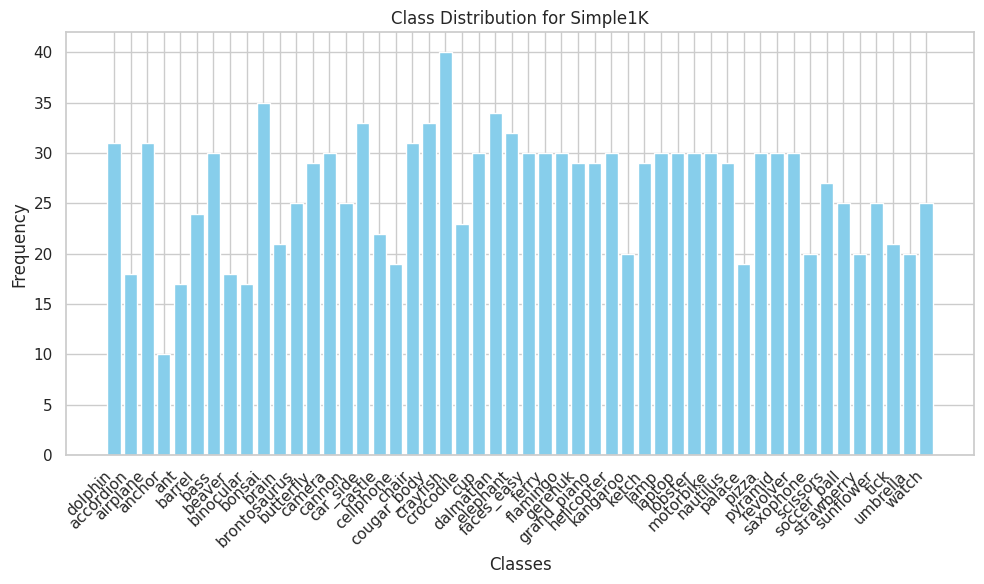

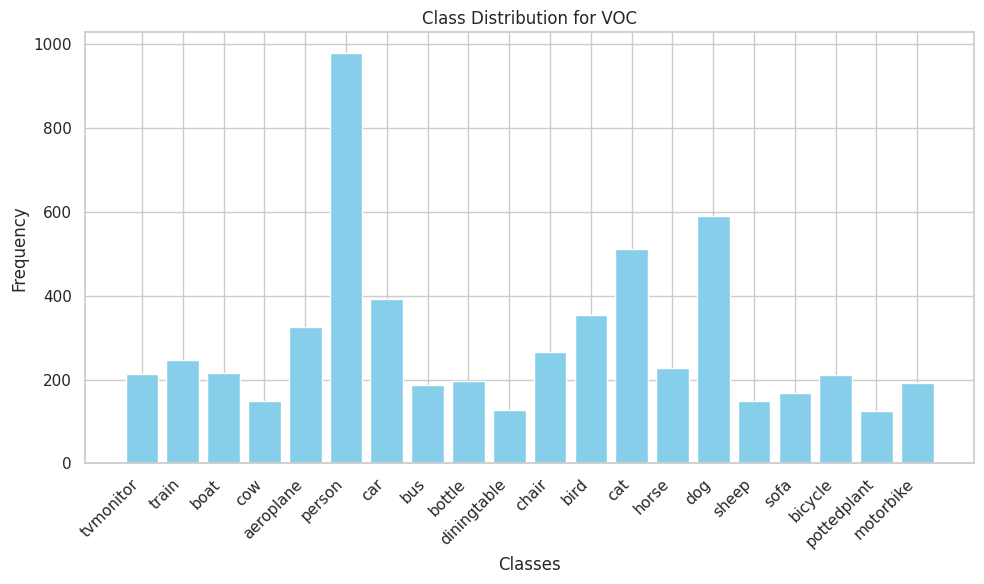

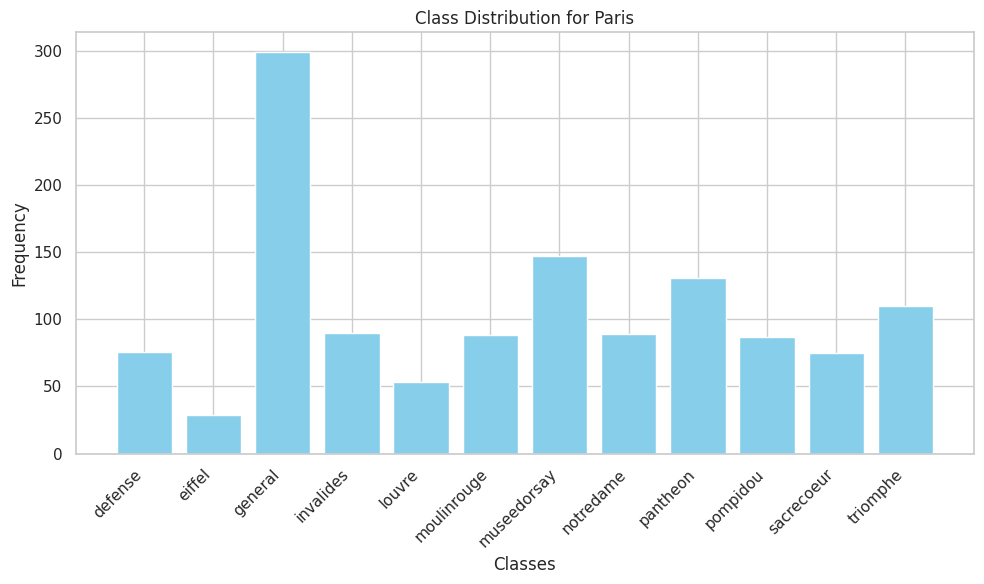

In [6]:
# Plot the class distribution of each dataset
simple1k_distribution = plot_class_distribution('simple1K/list_of_images.txt', 'Simple1K')

voc_distribution = plot_class_distribution('VOC_val/list_of_images.txt', 'VOC')

paris_distribution = plot_class_distribution('Paris_val/list_of_images.txt', 'Paris')


In [7]:
# Extract features from the Simple1K dataset using the ResNet model
# Features and labels will be used for evaluation
resnet_features, resnet_labels = extract_features(
    resnet_model,
    simple1k_loader,
    model_type="resnet",
    device=device
)

# -----------------------------------------
# Setup for CLIP
# -----------------------------------------

# Use CLIP's built-in preprocessing function for image input
transform_clip = preprocess_clip  # Provided directly by the CLIP model

# Create a new dataset instance for Simple1K using CLIP preprocessing
simple1k_clip = CustomImageDataset(
    data_dir=datasets_paths['simple1k'],
    label_file='simple1K/list_of_images.txt',
    transform=transform_clip
)

# DataLoader for CLIP-based feature extraction (batch size 1, no shuffle)
simple1k_loader_clip = DataLoader(simple1k_clip, batch_size=1, shuffle=False)

# -----------------------------------------
# Setup for DINOv2
# -----------------------------------------

# Define preprocessing pipeline for DINOv2 (ViT-based)
# Resize to 224x224 and normalize to match DINO's expected input range
transform_dino = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])  # Standard for DINOv2
])

# Create a new dataset instance for Simple1K using DINOv2 preprocessing
simple1k_dino = CustomImageDataset(
    data_dir=datasets_paths['simple1k'],
    label_file='simple1K/list_of_images.txt',
    transform=transform_dino
)

# DataLoader for DINOv2-based feature extraction (batch size 1, no shuffle)
simple1k_loader_dino = DataLoader(simple1k_dino, batch_size=1, shuffle=False)

100%|██████████| 1326/1326 [00:40<00:00, 33.08it/s]


In [8]:
# Evaluation mode, move the CLIP model and extract features.
clip_model.eval()
clip_model.to(device)

clip_features, clip_labels = extract_features(
    model=clip_model,
    dataloader=simple1k_loader_clip,
    model_type="clip",
    device=device
)


100%|██████████| 1326/1326 [02:06<00:00, 10.44it/s]


In [9]:
# Evaluation mode, move the DINOv2 model and extract features.
dinov2_model.eval()
dinov2_model.to(device)

dino_features, dino_labels = extract_features(
    model=dinov2_model,
    dataloader=simple1k_loader_dino,
    model_type="dinov2",
    device=device
)


100%|██████████| 1326/1326 [01:34<00:00, 14.05it/s]


In [10]:
# Save extracted feature vectors and corresponding labels to files for consistency and evaluation
np.save("resnet_features.npy", resnet_features)
np.save("clip_features.npy", clip_features)
np.save("dino_features.npy", dino_features)

np.save("resnet_labels.npy", resnet_labels)
np.save("clip_labels.npy", clip_labels)
np.save("dino_labels.npy", dino_labels)


In [18]:
# Evaluate the ResNet-based embeddings using cosine similarity and mAP
resnet_eval = evaluate_embeddings(resnet_features, resnet_labels)

# Plot a Precision-Recall (PR) curve for one of the best-performing queries
plot_pr_curve_for_query(
    resnet_eval["sim_matrix"][resnet_eval["best_idxs"][0]],
    resnet_labels,
    query_idx=resnet_eval["best_idxs"][0]
)

# Example of best and worst queries based on your results
best_query_idx = [367, 387, 379, 380, 381]
worst_query_idx = [443, 132, 1194, 338, 340]

# Generate PR curve for best query
plot_pr_curve_for_query(
    resnet_eval["sim_matrix"][resnet_eval["best_idxs"][0]],
    resnet_labels,
    query_idx=resnet_eval["best_idxs"][0],
    output_filename="best_query_pr_curve_resnet.png"
)

# Generate PR curve for worst query (same function, just change the query index)
plot_pr_curve_for_query(
    resnet_eval["sim_matrix"][resnet_eval["worst_idxs"][0]],
    resnet_labels,
    query_idx=resnet_eval["worst_idxs"][0],
    output_filename="worst_query_pr_curve_resnet.png"
)


Mean Average Precision (mAP): 0.7608


TypeError: bad operand type for unary -: 'str'

Mean Average Precision (mAP): 0.8269

🟢 Best Queries:
Idx: 239, Label: brain, AP: 1.0000
Idx: 231, Label: brain, AP: 1.0000
Idx: 250, Label: brain, AP: 1.0000
Idx: 249, Label: brain, AP: 1.0000
Idx: 247, Label: brain, AP: 1.0000

🔴 Worst Queries:
Idx: 972, Label: lobster, AP: 0.0493
Idx: 338, Label: cannon, AP: 0.0502
Idx: 99, Label: ant, AP: 0.0513
Idx: 337, Label: cannon, AP: 0.0529
Idx: 336, Label: cannon, AP: 0.0681


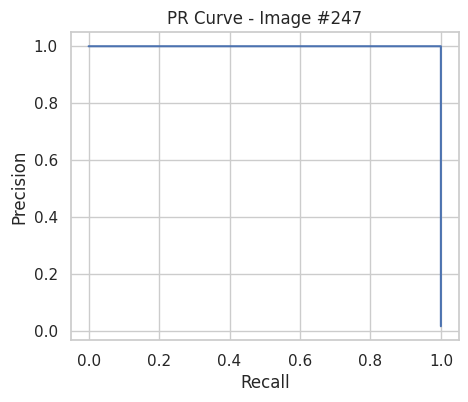

In [38]:
# Evaluate the CLIP-based embeddings by computing cosine similarity, AP per query, and overall mAP
clip_eval = evaluate_embeddings(clip_features, clip_labels)

# Plot the Precision-Recall (PR) curve for one of the best-performing queries using CLIP
plot_pr_curve_for_query(
    sim_row=clip_eval["sim_matrix"][clip_eval["best_idxs"][0]],
    labels=clip_labels,
    query_idx=clip_eval["best_idxs"][0]
)

# Example of best and worst queries based on your results
best_query_idx = [239, 231, 250, 249, 247]
worst_query_idx = [972, 338, 99, 337, 336]

# Generate PR curve for best query
plot_pr_curve_for_query(
    clip_eval["sim_matrix"][clip_eval["best_idxs"][0]],
    clip_labels,
    query_idx=clip_eval["best_idxs"][0],
    output_filename="best_query_pr_curve_clip.png"
)

# Generate PR curve for worst query (same function, just change the query index)
plot_pr_curve_for_query(
    clip_eval["sim_matrix"][clip_eval["worst_idxs"][0]],
    clip_labels,
    query_idx=clip_eval["worst_idxs"][0],
    output_filename="worst_query_pr_curve_clip.png"
)


Mean Average Precision (mAP): 0.9313

🟢 Best Queries:
Idx: 251, Label: brain, AP: 1.0000
Idx: 1261, Label: tick, AP: 1.0000
Idx: 236, Label: brain, AP: 1.0000
Idx: 237, Label: brain, AP: 1.0000
Idx: 238, Label: brain, AP: 1.0000

🔴 Worst Queries:
Idx: 578, Label: cup, AP: 0.0701
Idx: 1044, Label: palace, AP: 0.1051
Idx: 1048, Label: palace, AP: 0.1302
Idx: 464, Label: chair, AP: 0.1365
Idx: 465, Label: chair, AP: 0.1598


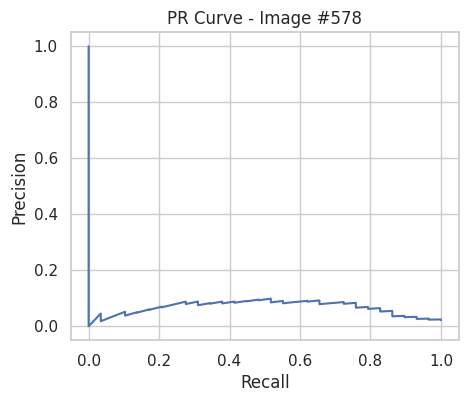

In [39]:
# Evaluate the DINOv2-based embeddings by computing cosine similarity, AP per query, and overall mAP
dino_eval = evaluate_embeddings(dino_features, dino_labels)

# Plot the Precision-Recall (PR) curve for one of the worst-performing queries using DINOv2
plot_pr_curve_for_query(
    sim_row=dino_eval["sim_matrix"][dino_eval["worst_idxs"][0]],
    labels=dino_labels,
    query_idx=dino_eval["worst_idxs"][0]
)

# Example of best and worst queries based on your results
best_query_idx = [251, 1261, 236, 237, 238]
worst_query_idx = [578, 1044, 1048, 464, 465]

# Generate PR curve for best query
plot_pr_curve_for_query(
    dino_eval["sim_matrix"][dino_eval["best_idxs"][0]],
    dino_labels,
    query_idx=dino_eval["best_idxs"][0],
    output_filename="best_query_pr_curve_dino.png"
)

# Generate PR curve for worst query (same function, just change the query index)
plot_pr_curve_for_query(
    dino_eval["sim_matrix"][dino_eval["worst_idxs"][0]],
    dino_labels,
    query_idx=dino_eval["worst_idxs"][0],
    output_filename="worst_query_pr_curve_dino.png"
)



In [40]:
print_map_comparison(resnet_eval, clip_eval, dino_eval)


Model       | mAP
--------------------
ResNet18    | 0.7608
CLIP        | 0.8269
DINOv2      | 0.9313


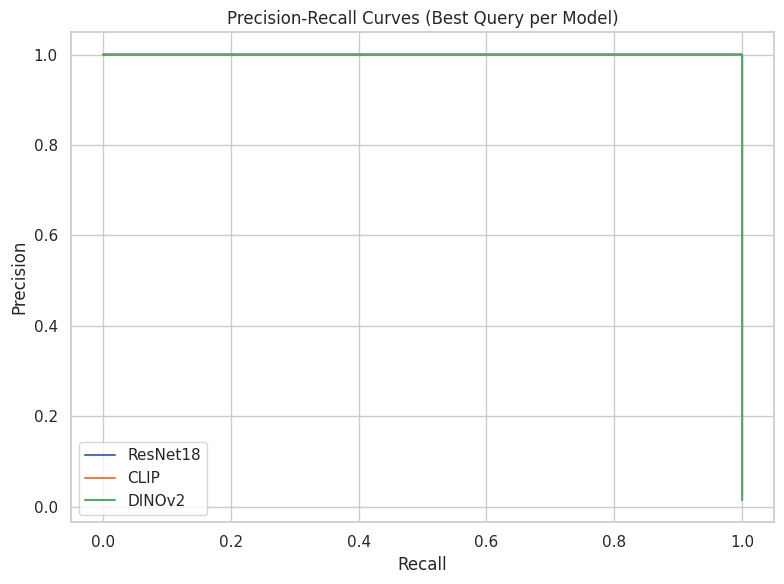

In [41]:
plot_all_pr_curves(
    eval_results=[resnet_eval, clip_eval, dino_eval],
    labels=[resnet_labels, clip_labels, dino_labels],
    model_names=["ResNet18", "CLIP", "DINOv2"]
)


In [22]:
# Define model metadata
models_info = {
    "ResNet18": {
        "model": resnet_model,
        "transform": transform,
        "model_type": "resnet"
    },
    "CLIP": {
        "model": clip_model,
        "transform": preprocess_clip,
        "model_type": "clip"
    },
    "DINOv2": {
        "model": dinov2_model,
        "transform": transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5], std=[0.5])
        ]),
        "model_type": "dinov2"
    }
}

In [23]:
# Define datasets metadata
datasets_info = {
    "Simple1K": {
        "data_dir": datasets_paths["simple1k"],
        "label_file": "simple1K/list_of_images.txt"
    },
    "VOC": {
        "data_dir": datasets_paths["VOC"],
        "label_file": "VOC_val/list_of_images.txt"
    },
    "Paris": {
        "data_dir": datasets_paths["Paris"],
        "label_file": "Paris_val/list_of_images.txt"
    }
}



📂 Processing dataset: Simple1K
🔍  Extracting features using: ResNet18


100%|██████████| 1326/1326 [00:52<00:00, 25.49it/s]


Mean Average Precision (mAP): 0.7608

🟢 Best Queries:
Idx: 367, Label: car_side, AP: 1.0000
Idx: 387, Label: car_side, AP: 1.0000
Idx: 379, Label: car_side, AP: 1.0000
Idx: 380, Label: car_side, AP: 1.0000
Idx: 381, Label: car_side, AP: 1.0000

🔴 Worst Queries:
Idx: 443, Label: chair, AP: 0.0292
Idx: 132, Label: bass, AP: 0.0305
Idx: 1194, Label: soccer_ball, AP: 0.0433
Idx: 338, Label: cannon, AP: 0.0452
Idx: 340, Label: cannon, AP: 0.0478

🟢 Showing images from the best queries for ResNet18 in Simple1K


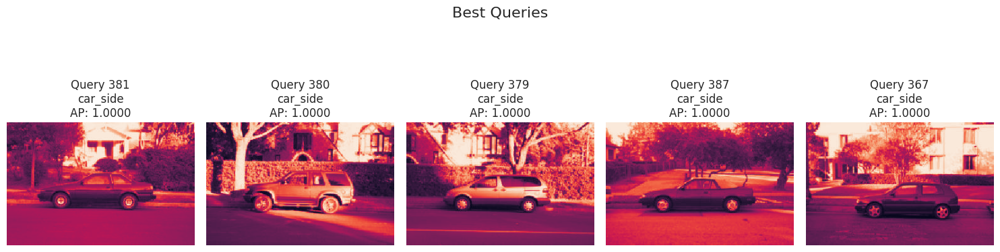


🔴 Showing images from the worst queries for ResNet18 in Simple1K


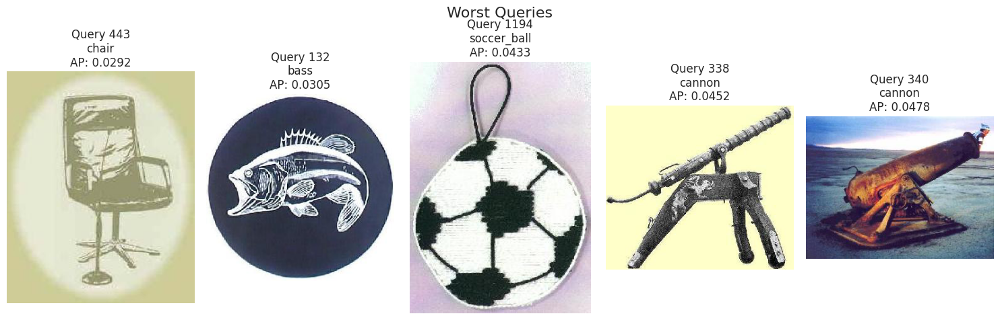

🔍  Extracting features using: CLIP


100%|██████████| 1326/1326 [02:34<00:00,  8.58it/s]


Mean Average Precision (mAP): 0.8269

🟢 Best Queries:
Idx: 239, Label: brain, AP: 1.0000
Idx: 247, Label: brain, AP: 1.0000
Idx: 242, Label: brain, AP: 1.0000
Idx: 240, Label: brain, AP: 1.0000
Idx: 249, Label: brain, AP: 1.0000

🔴 Worst Queries:
Idx: 972, Label: lobster, AP: 0.0493
Idx: 338, Label: cannon, AP: 0.0502
Idx: 99, Label: ant, AP: 0.0513
Idx: 337, Label: cannon, AP: 0.0529
Idx: 336, Label: cannon, AP: 0.0681

🟢 Showing images from the best queries for CLIP in Simple1K


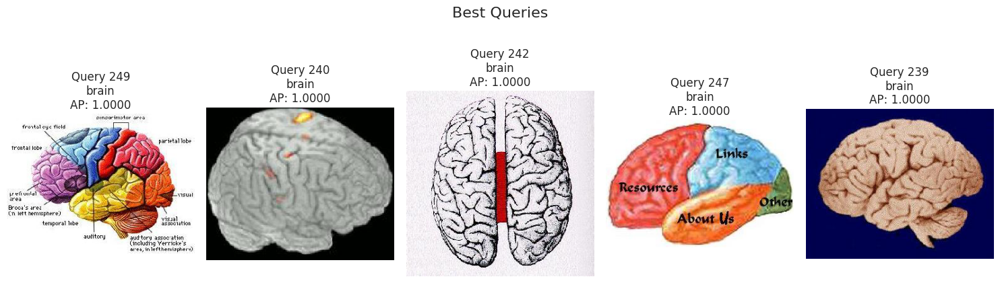


🔴 Showing images from the worst queries for CLIP in Simple1K


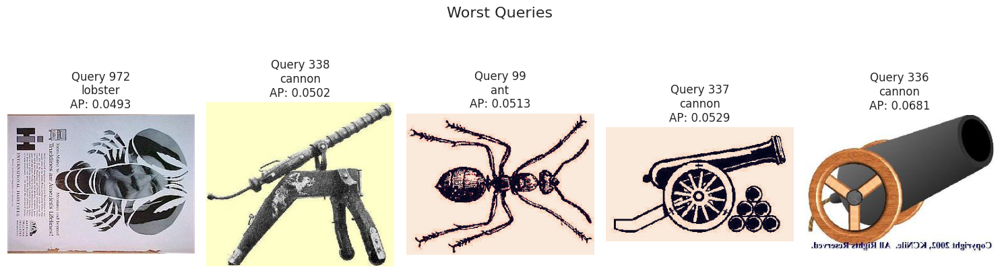

🔍  Extracting features using: DINOv2


100%|██████████| 1326/1326 [02:06<00:00, 10.47it/s]


Mean Average Precision (mAP): 0.9313

🟢 Best Queries:
Idx: 235, Label: brain, AP: 1.0000
Idx: 1261, Label: tick, AP: 1.0000
Idx: 237, Label: brain, AP: 1.0000
Idx: 238, Label: brain, AP: 1.0000
Idx: 239, Label: brain, AP: 1.0000

🔴 Worst Queries:
Idx: 578, Label: cup, AP: 0.0701
Idx: 1044, Label: palace, AP: 0.1051
Idx: 1048, Label: palace, AP: 0.1302
Idx: 464, Label: chair, AP: 0.1365
Idx: 465, Label: chair, AP: 0.1598

🟢 Showing images from the best queries for DINOv2 in Simple1K


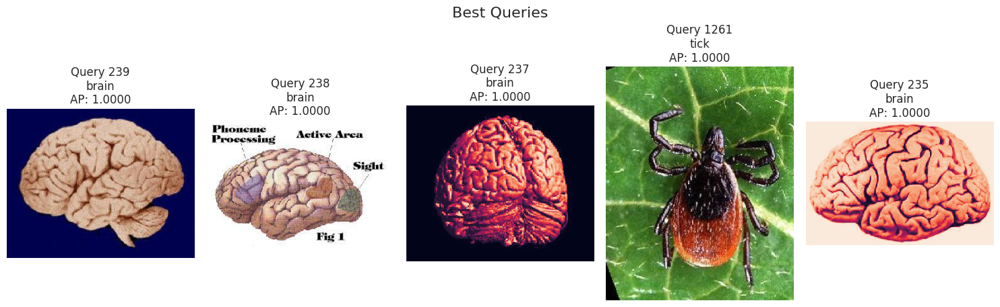


🔴 Showing images from the worst queries for DINOv2 in Simple1K


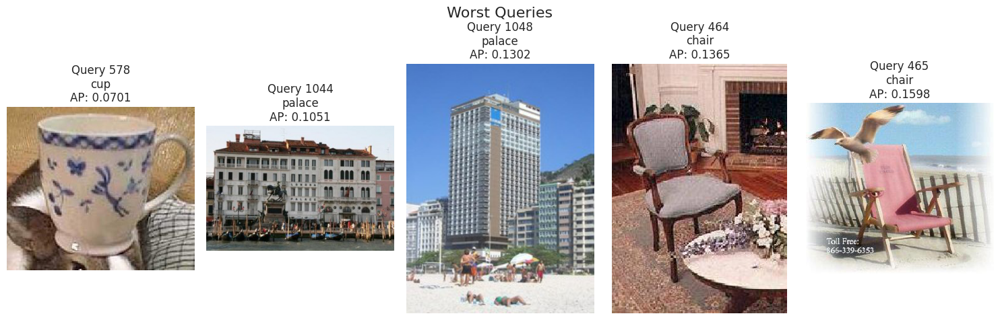


📂 Processing dataset: VOC
🔍  Extracting features using: ResNet18


100%|██████████| 5823/5823 [03:55<00:00, 24.74it/s]


Mean Average Precision (mAP): 0.3893

🟢 Best Queries:
Idx: 868, Label: aeroplane, AP: 0.9049
Idx: 1328, Label: aeroplane, AP: 0.9048
Idx: 2989, Label: aeroplane, AP: 0.9045
Idx: 1693, Label: aeroplane, AP: 0.9034
Idx: 1761, Label: aeroplane, AP: 0.9026

🔴 Worst Queries:
Idx: 72, Label: pottedplant, AP: 0.0181
Idx: 4871, Label: sheep, AP: 0.0188
Idx: 4273, Label: cow, AP: 0.0195
Idx: 5191, Label: sheep, AP: 0.0206
Idx: 2081, Label: pottedplant, AP: 0.0221

🟢 Showing images from the best queries for ResNet18 in VOC


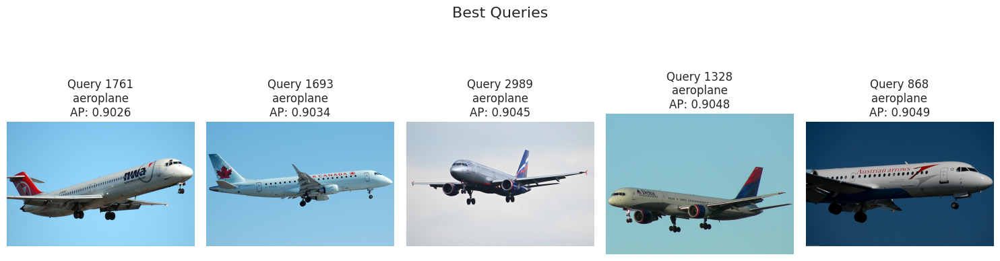


🔴 Showing images from the worst queries for ResNet18 in VOC


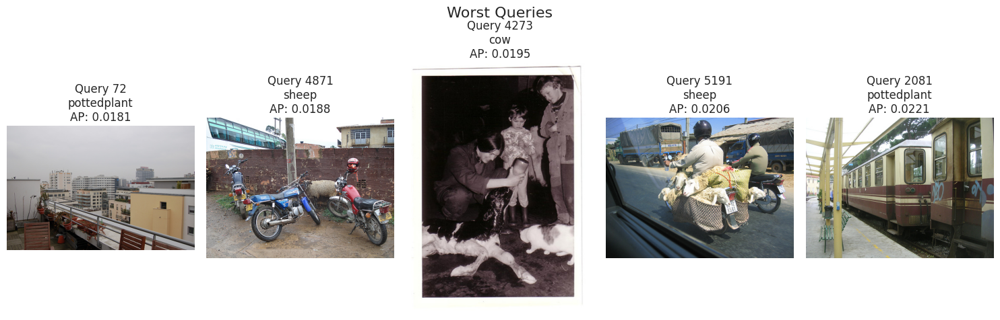

🔍  Extracting features using: CLIP


100%|██████████| 5823/5823 [10:02<00:00,  9.66it/s]


Mean Average Precision (mAP): 0.4647

🟢 Best Queries:
Idx: 1007, Label: bird, AP: 0.9425
Idx: 4401, Label: aeroplane, AP: 0.9212
Idx: 2975, Label: aeroplane, AP: 0.9206
Idx: 878, Label: aeroplane, AP: 0.9188
Idx: 5686, Label: aeroplane, AP: 0.9177

🔴 Worst Queries:
Idx: 5155, Label: bus, AP: 0.0188
Idx: 2081, Label: pottedplant, AP: 0.0208
Idx: 5795, Label: diningtable, AP: 0.0215
Idx: 1739, Label: pottedplant, AP: 0.0224
Idx: 5514, Label: pottedplant, AP: 0.0241

🟢 Showing images from the best queries for CLIP in VOC


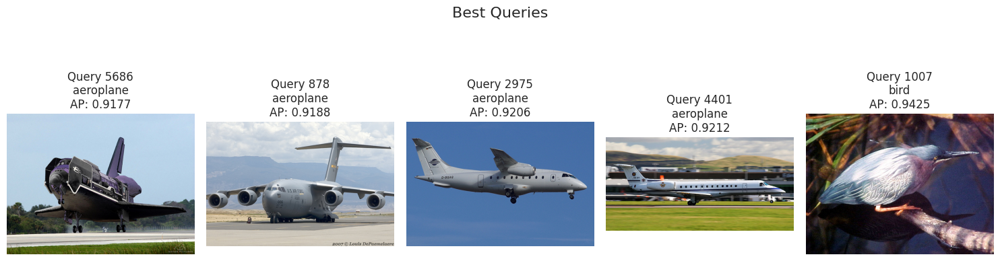


🔴 Showing images from the worst queries for CLIP in VOC


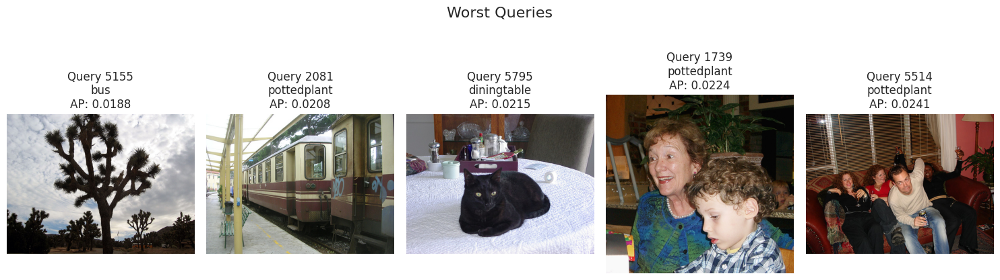

🔍  Extracting features using: DINOv2


100%|██████████| 5823/5823 [08:27<00:00, 11.47it/s]


Mean Average Precision (mAP): 0.4710

🟢 Best Queries:
Idx: 4151, Label: horse, AP: 0.9440
Idx: 2385, Label: train, AP: 0.9398
Idx: 4087, Label: cat, AP: 0.9378
Idx: 2766, Label: train, AP: 0.9375
Idx: 4436, Label: cat, AP: 0.9366

🔴 Worst Queries:
Idx: 2081, Label: pottedplant, AP: 0.0159
Idx: 2091, Label: pottedplant, AP: 0.0174
Idx: 4161, Label: pottedplant, AP: 0.0204
Idx: 5477, Label: pottedplant, AP: 0.0204
Idx: 750, Label: pottedplant, AP: 0.0210

🟢 Showing images from the best queries for DINOv2 in VOC


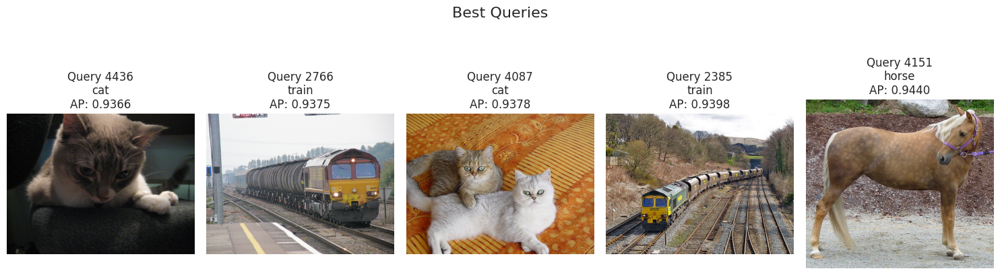


🔴 Showing images from the worst queries for DINOv2 in VOC


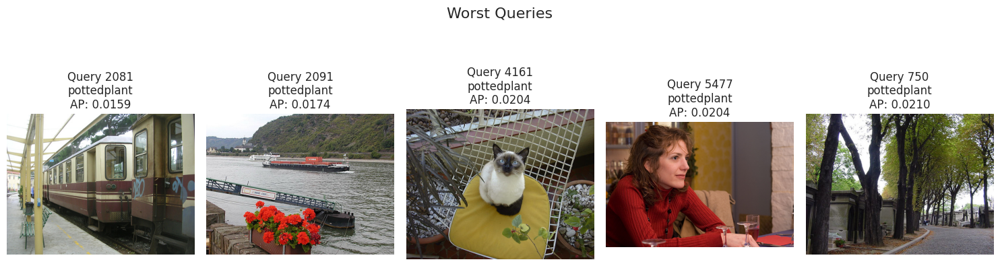


📂 Processing dataset: Paris
🔍  Extracting features using: ResNet18


100%|██████████| 1274/1274 [01:04<00:00, 19.79it/s]


Mean Average Precision (mAP): 0.2599

🟢 Best Queries:
Idx: 550, Label: moulinrouge, AP: 0.7702
Idx: 625, Label: moulinrouge, AP: 0.7628
Idx: 623, Label: moulinrouge, AP: 0.7534
Idx: 621, Label: moulinrouge, AP: 0.7524
Idx: 581, Label: moulinrouge, AP: 0.7449

🔴 Worst Queries:
Idx: 96, Label: eiffel, AP: 0.0328
Idx: 91, Label: eiffel, AP: 0.0334
Idx: 628, Label: moulinrouge, AP: 0.0414
Idx: 79, Label: eiffel, AP: 0.0418
Idx: 77, Label: eiffel, AP: 0.0448

🟢 Showing images from the best queries for ResNet18 in Paris


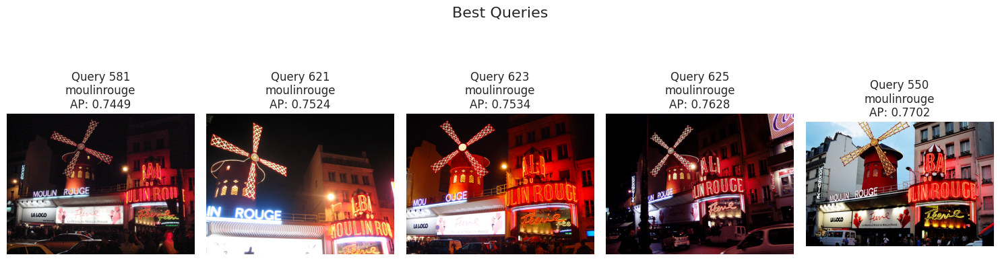


🔴 Showing images from the worst queries for ResNet18 in Paris


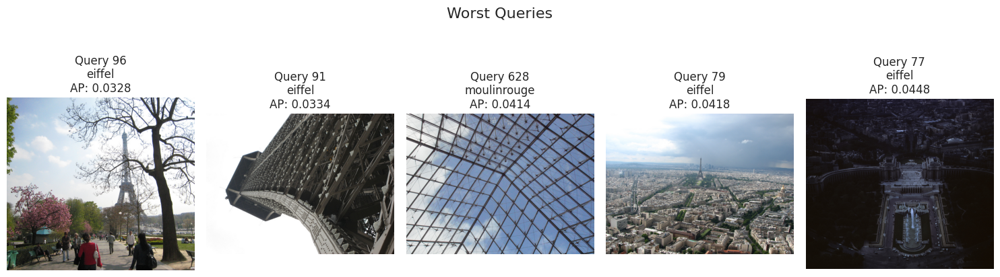

🔍  Extracting features using: CLIP


100%|██████████| 1274/1274 [02:51<00:00,  7.41it/s]


Mean Average Precision (mAP): 0.3225

🟢 Best Queries:
Idx: 581, Label: moulinrouge, AP: 0.7202
Idx: 605, Label: moulinrouge, AP: 0.7194
Idx: 564, Label: moulinrouge, AP: 0.7095
Idx: 615, Label: moulinrouge, AP: 0.7020
Idx: 623, Label: moulinrouge, AP: 0.6980

🔴 Worst Queries:
Idx: 606, Label: moulinrouge, AP: 0.0375
Idx: 614, Label: moulinrouge, AP: 0.0385
Idx: 628, Label: moulinrouge, AP: 0.0423
Idx: 60, Label: defense, AP: 0.0431
Idx: 572, Label: moulinrouge, AP: 0.0432

🟢 Showing images from the best queries for CLIP in Paris


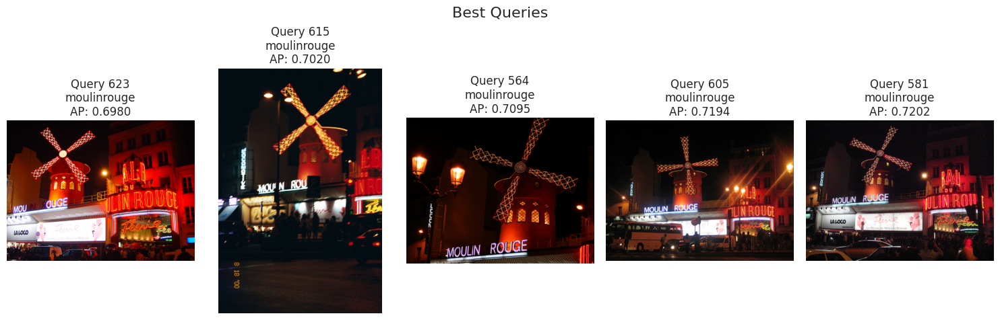


🔴 Showing images from the worst queries for CLIP in Paris


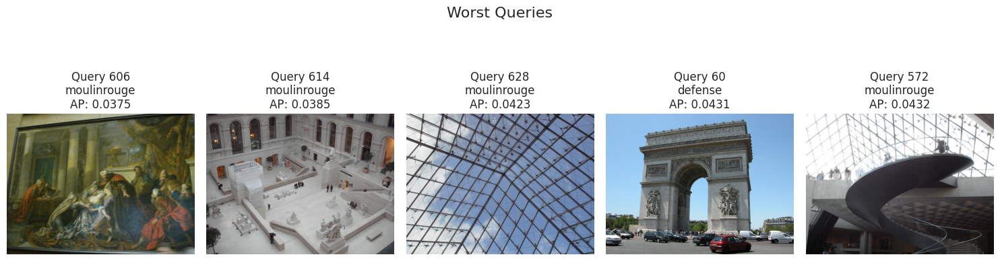

🔍  Extracting features using: DINOv2


100%|██████████| 1274/1274 [02:15<00:00,  9.39it/s]


Mean Average Precision (mAP): 0.3970

🟢 Best Queries:
Idx: 621, Label: moulinrouge, AP: 0.8580
Idx: 574, Label: moulinrouge, AP: 0.8557
Idx: 549, Label: moulinrouge, AP: 0.8521
Idx: 623, Label: moulinrouge, AP: 0.8512
Idx: 581, Label: moulinrouge, AP: 0.8474

🔴 Worst Queries:
Idx: 1137, Label: sacrecoeur, AP: 0.0403
Idx: 614, Label: moulinrouge, AP: 0.0405
Idx: 628, Label: moulinrouge, AP: 0.0456
Idx: 1059, Label: pompidou, AP: 0.0459
Idx: 870, Label: notredame, AP: 0.0473

🟢 Showing images from the best queries for DINOv2 in Paris


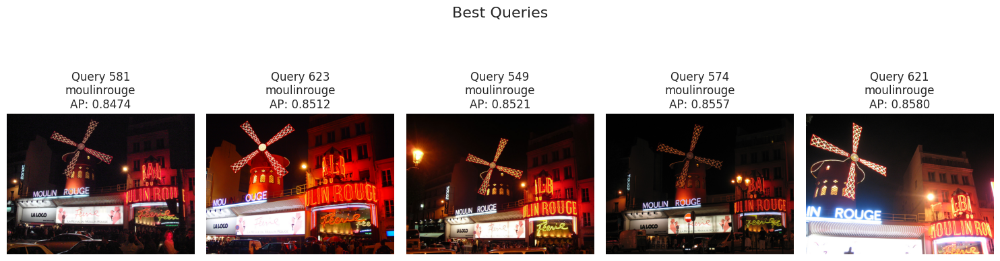


🔴 Showing images from the worst queries for DINOv2 in Paris


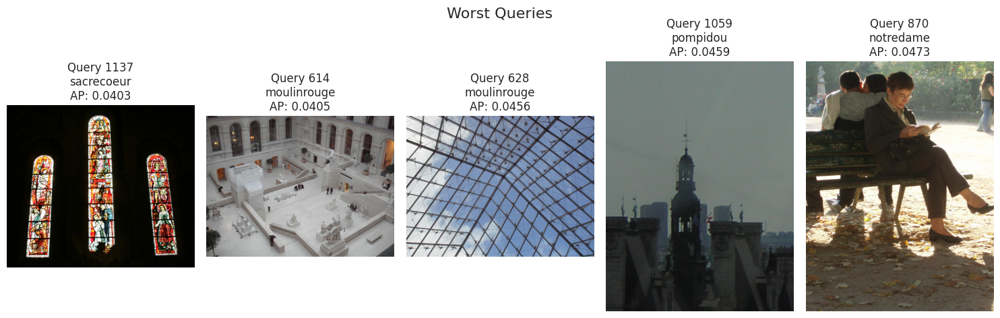

In [59]:
# Process and store results
results = {}

for dataset_name, dataset_meta in datasets_info.items():
    print(f"\n📂 Processing dataset: {dataset_name}")
    results[dataset_name] = {}

    # Cargar las rutas de las imágenes desde el archivo `list_of_images.txt` para cada dataset
    image_list_file = os.path.join(dataset_meta["label_file"])
    image_paths = load_image_paths(image_list_file)  # Cargar las rutas de las imágenes
    
    for model_name, model_meta in models_info.items():
        print(f"🔍  Extracting features using: {model_name}")
        
        # Create dataset and dataloader
        dataset = CustomImageDataset(
            data_dir=dataset_meta["data_dir"],
            label_file=dataset_meta["label_file"],
            transform=model_meta["transform"]
        )
        dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

        # Evaluate embeddings
        model = model_meta["model"]
        model.to(device)
        model.eval()

        features, labels = extract_features(
            model=model,
            dataloader=dataloader,
            model_type=model_meta["model_type"],
            device=device
        )
        
        eval_result = evaluate_embeddings(features, labels)
        
        # Store all results
        results[dataset_name][model_name] = {
            "features": features,
            "labels": labels,
            "evaluation": eval_result
        }

        # Mostrar imágenes de las mejores y peores consultas
        best_query_idxs = eval_result["best_idxs"][:5]  # Top 5 mejores consultas
        worst_query_idxs = eval_result["worst_idxs"][:5]  # Top 5 peores consultas

        # Mostrar imágenes para las mejores consultas en una subfigura
        print(f"\n🟢 Showing images from the best queries for {model_name} in {dataset_name}")
        show_images_in_subfigures(best_query_idxs, image_paths, dataset_meta["data_dir"], labels, eval_result['ap_scores'], "Best Queries")

        # Mostrar imágenes para las peores consultas en una subfigura
        print(f"\n🔴 Showing images from the worst queries for {model_name} in {dataset_name}")
        show_images_in_subfigures(worst_query_idxs, image_paths, dataset_meta["data_dir"], labels, eval_result['ap_scores'], "Worst Queries")



📈 Plotting PR curves for Simple1K


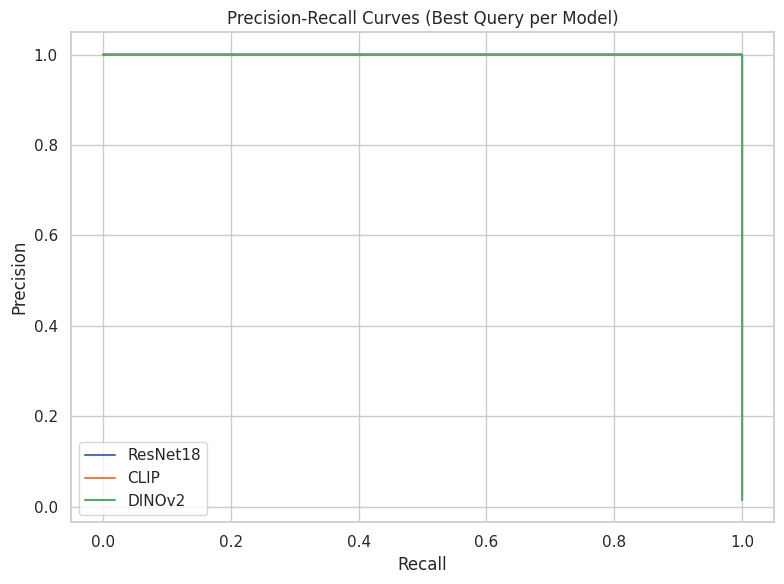


📋 mAP Comparison for Simple1K
Model       | mAP
--------------------
ResNet18    | 0.7608
CLIP        | 0.8269
DINOv2      | 0.9313

📊 Precision by class for model Simple1K


/tmp/ipykernel_8711/3265065509.py:453: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=precision_per_class, ax=ax, palette="viridis")



--- ResNet18 ---
  accordion: 1.0000
  airplane: 0.8824
  anchor: 0.9000
  ant: 0.8333
  barrel: 1.0000
  bass: 0.7647
  beaver: 1.0000
  binocular: 1.0000
  bonsai: 1.0000
  brain: 0.9091
  brontosaurus: 0.8148
  butterfly: 0.9583
  camera: 0.9677
  cannon: 0.8636
  car_side: 1.0000
  castle: 1.0000
  cellphone: 1.0000
  chair: 0.9375
  cougar_body: 0.9143
  crayfish: 0.7907
  crocodile: 0.8261
  cup: 0.9655
  dalmatian: 0.9714
  dolphin: 0.8667
  elephant: 1.0000
  faces_easy: 1.0000
  ferry: 0.9677
  flamingo: 1.0000
  gerenuk: 0.9655
  grand_piano: 1.0000
  helicopter: 0.8571
  kangaroo: 0.9500
  ketch: 0.9667
  lamp: 0.9000
  laptop: 0.9677
  lobster: 0.8571
  motorbike: 1.0000
  nautilus: 0.8750
  palace: 0.9000
  pizza: 0.8788
  pyramid: 0.9333
  revolver: 0.9032
  saxophone: 0.9474
  scissors: 0.8929
  soccer_ball: 0.9565
  strawberry: 0.9524
  sunflower: 0.9259
  tick: 0.9048
  umbrella: 0.7619
  watch: 0.9200


/tmp/ipykernel_8711/3265065509.py:453: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=precision_per_class, ax=ax, palette="viridis")



--- CLIP ---
  accordion: 1.0000
  airplane: 1.0000
  anchor: 0.6429
  ant: 0.9375
  barrel: 0.9565
  bass: 0.9375
  beaver: 1.0000
  binocular: 0.8000
  bonsai: 1.0000
  brain: 1.0000
  brontosaurus: 0.9231
  butterfly: 1.0000
  camera: 0.9333
  cannon: 1.0000
  car_side: 1.0000
  castle: 1.0000
  cellphone: 1.0000
  chair: 0.9310
  cougar_body: 0.9697
  crayfish: 0.7692
  crocodile: 0.9565
  cup: 1.0000
  dalmatian: 1.0000
  dolphin: 1.0000
  elephant: 1.0000
  faces_easy: 1.0000
  ferry: 1.0000
  flamingo: 1.0000
  gerenuk: 0.9655
  grand_piano: 1.0000
  helicopter: 0.9677
  kangaroo: 0.9524
  ketch: 0.9655
  lamp: 0.9643
  laptop: 0.9355
  lobster: 0.6552
  motorbike: 1.0000
  nautilus: 0.8750
  palace: 1.0000
  pizza: 1.0000
  pyramid: 1.0000
  revolver: 1.0000
  saxophone: 0.9500
  scissors: 0.8667
  soccer_ball: 1.0000
  strawberry: 1.0000
  sunflower: 0.9615
  tick: 1.0000
  umbrella: 0.9500
  watch: 1.0000


/tmp/ipykernel_8711/3265065509.py:453: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=precision_per_class, ax=ax, palette="viridis")



--- DINOv2 ---
  accordion: 1.0000
  airplane: 1.0000
  anchor: 0.8333
  ant: 1.0000
  barrel: 0.9600
  bass: 1.0000
  beaver: 0.9474
  binocular: 1.0000
  bonsai: 0.9722
  brain: 1.0000
  brontosaurus: 0.9615
  butterfly: 1.0000
  camera: 1.0000
  cannon: 1.0000
  car_side: 1.0000
  castle: 1.0000
  cellphone: 1.0000
  chair: 1.0000
  cougar_body: 1.0000
  crayfish: 0.7778
  crocodile: 1.0000
  cup: 1.0000
  dalmatian: 1.0000
  dolphin: 1.0000
  elephant: 1.0000
  faces_easy: 1.0000
  ferry: 0.9375
  flamingo: 1.0000
  gerenuk: 1.0000
  grand_piano: 1.0000
  helicopter: 1.0000
  kangaroo: 1.0000
  ketch: 1.0000
  lamp: 0.9667
  laptop: 1.0000
  lobster: 0.8000
  motorbike: 1.0000
  nautilus: 1.0000
  palace: 1.0000
  pizza: 0.9677
  pyramid: 1.0000
  revolver: 1.0000
  saxophone: 1.0000
  scissors: 1.0000
  soccer_ball: 1.0000
  strawberry: 1.0000
  sunflower: 0.9615
  tick: 1.0000
  umbrella: 0.9091
  watch: 1.0000


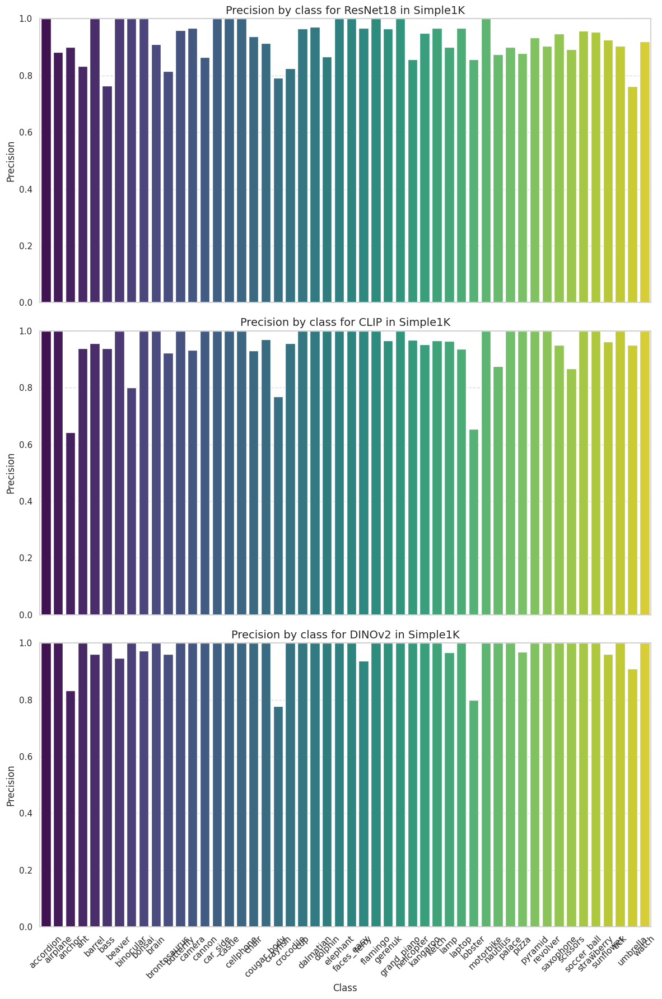


📈 Plotting PR curves for VOC


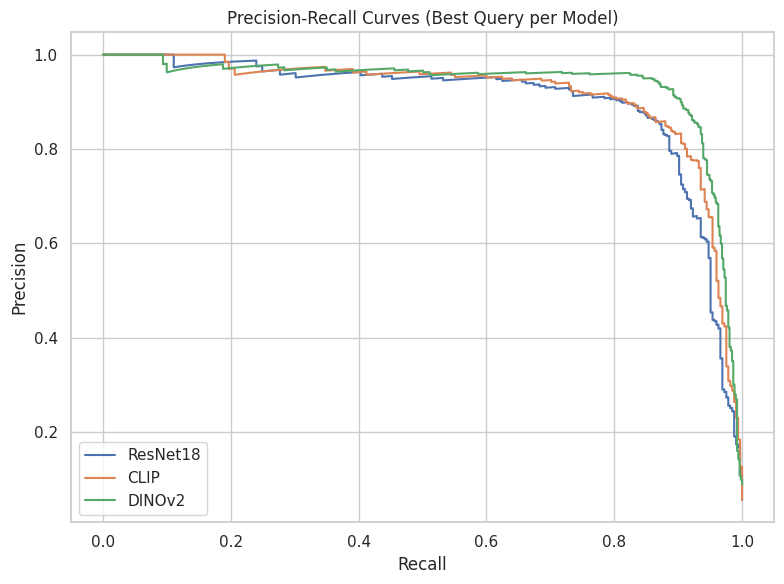


📋 mAP Comparison for VOC
Model       | mAP
--------------------
ResNet18    | 0.3893
CLIP        | 0.4647
DINOv2      | 0.4710

📊 Precision by class for model VOC


/tmp/ipykernel_8711/3265065509.py:453: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=precision_per_class, ax=ax, palette="viridis")



--- ResNet18 ---
  aeroplane: 0.8410
  bicycle: 0.6274
  bird: 0.8893
  boat: 0.7343
  bottle: 0.4740
  bus: 0.7330
  car: 0.6276
  cat: 0.8205
  chair: 0.3257
  cow: 0.6027
  diningtable: 0.2188
  dog: 0.7912
  horse: 0.6738
  motorbike: 0.6398
  person: 0.5333
  pottedplant: 0.4412
  sheep: 0.6585
  sofa: 0.3284
  train: 0.7645
  tvmonitor: 0.6447


/tmp/ipykernel_8711/3265065509.py:453: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=precision_per_class, ax=ax, palette="viridis")



--- CLIP ---
  aeroplane: 0.8997
  bicycle: 0.6422
  bird: 0.9444
  boat: 0.7808
  bottle: 0.5860
  bus: 0.8241
  car: 0.7241
  cat: 0.9019
  chair: 0.3874
  cow: 0.8367
  diningtable: 0.2701
  dog: 0.8567
  horse: 0.8522
  motorbike: 0.7190
  person: 0.6260
  pottedplant: 0.4511
  sheep: 0.8217
  sofa: 0.3000
  train: 0.8321
  tvmonitor: 0.7009


/tmp/ipykernel_8711/3265065509.py:453: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=precision_per_class, ax=ax, palette="viridis")



--- DINOv2 ---
  aeroplane: 0.9104
  bicycle: 0.6964
  bird: 0.9415
  boat: 0.8098
  bottle: 0.5789
  bus: 0.8492
  car: 0.7722
  cat: 0.8889
  chair: 0.4630
  cow: 0.8679
  diningtable: 0.2734
  dog: 0.8921
  horse: 0.8995
  motorbike: 0.7910
  person: 0.5905
  pottedplant: 0.4880
  sheep: 0.8679
  sofa: 0.4706
  train: 0.8635
  tvmonitor: 0.6828


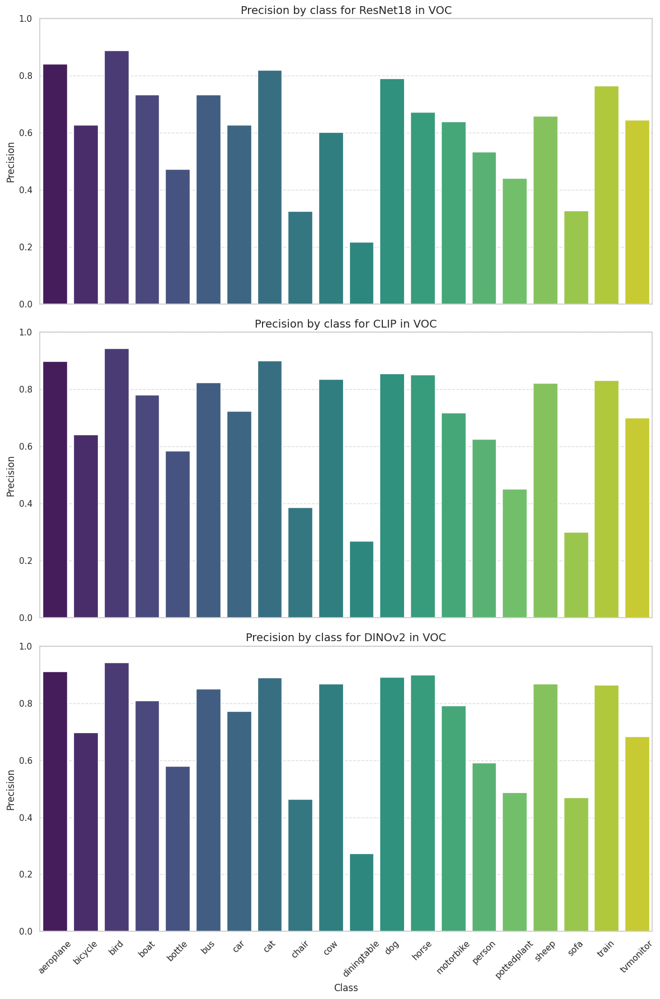


📈 Plotting PR curves for Paris


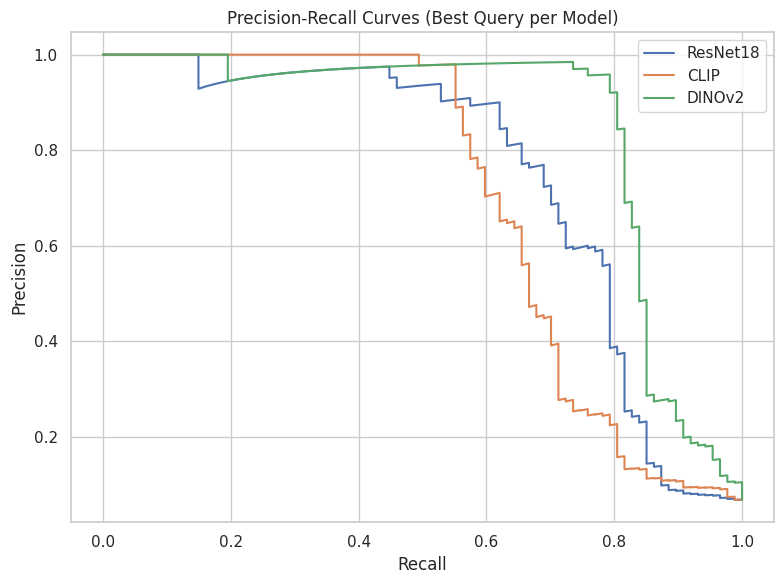


📋 mAP Comparison for Paris
Model       | mAP
--------------------
ResNet18    | 0.2599
CLIP        | 0.3225
DINOv2      | 0.3970

📊 Precision by class for model Paris

--- ResNet18 ---
  defense: 0.6042
  eiffel: 0.1613
  general: 0.6122
  invalides: 0.6535
  louvre: 0.6557
  moulinrouge: 0.7527
  museedorsay: 0.6667
  notredame: 0.7079
  pantheon: 0.7381
  pompidou: 0.6024
  sacrecoeur: 0.7031
  triomphe: 0.7073


/tmp/ipykernel_8711/3265065509.py:453: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=precision_per_class, ax=ax, palette="viridis")
/tmp/ipykernel_8711/3265065509.py:453: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=precision_per_class, ax=ax, palette="viridis")



--- CLIP ---
  defense: 0.7561
  eiffel: 0.2727
  general: 0.6679
  invalides: 0.7474
  louvre: 0.7593
  moulinrouge: 0.7660
  museedorsay: 0.7667
  notredame: 0.8295
  pantheon: 0.7734
  pompidou: 0.7500
  sacrecoeur: 0.7344
  triomphe: 0.6615

--- DINOv2 ---
  defense: 0.8000
  eiffel: 0.1935
  general: 0.6527
  invalides: 0.7212
  louvre: 0.6735
  moulinrouge: 0.7684
  museedorsay: 0.7857
  notredame: 0.8132
  pantheon: 0.7413
  pompidou: 0.7765
  sacrecoeur: 0.8261
  triomphe: 0.7520


/tmp/ipykernel_8711/3265065509.py:453: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=precision_per_class, ax=ax, palette="viridis")


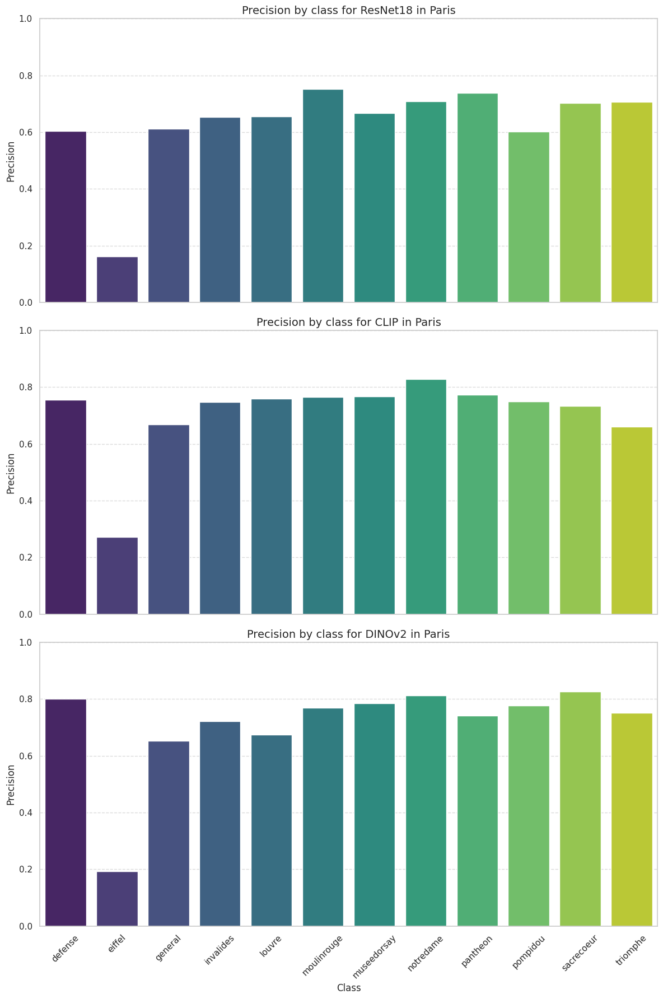

In [98]:
# After processing all datasets and models
for dataset_name in results:
    print(f"\n📈 Plotting PR curves for {dataset_name}")
    
    evals = [results[dataset_name][m]["evaluation"] for m in models_info]
    labels = results[dataset_name][list(models_info.keys())[0]]["labels"]  # Get labels from the first model
    model_names = list(models_info.keys())
    
    unique_classes = sorted(list(set(labels)))  # Use unique classes from the first model's labels
    
    plot_all_pr_curves(evals, [labels]*len(models_info), model_names)  # Ensure `labels` is passed correctly
    
    print(f"\n📋 mAP Comparison for {dataset_name}")
    print_map_comparison(*evals)
    
    # Plot precision per class for each model
    plot_class_precision(
        models_eval_results=evals,
        labels=[labels]*len(models_info), 
        model_names=model_names,
        classes=unique_classes,  
        dataset_name=dataset_name
    )
